In [1]:
import pandas as pd
import numpy as np 

In [2]:
train_data = pd.read_csv('train_hp.csv')
test_data = pd.read_csv('test hp.csv')

In [3]:
train_data.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [4]:
test_data.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1461,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,AllPub,...,120,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal
1,1462,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal
2,1463,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal
3,1464,60,RL,78.0,9978,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,6,2010,WD,Normal
4,1465,120,RL,43.0,5005,Pave,NaN,IR1,HLS,AllPub,...,144,0,NaN,NaN,NaN,0,1,2010,WD,Normal


In [5]:
import seaborn as sns
import matplotlib.pylab as plt

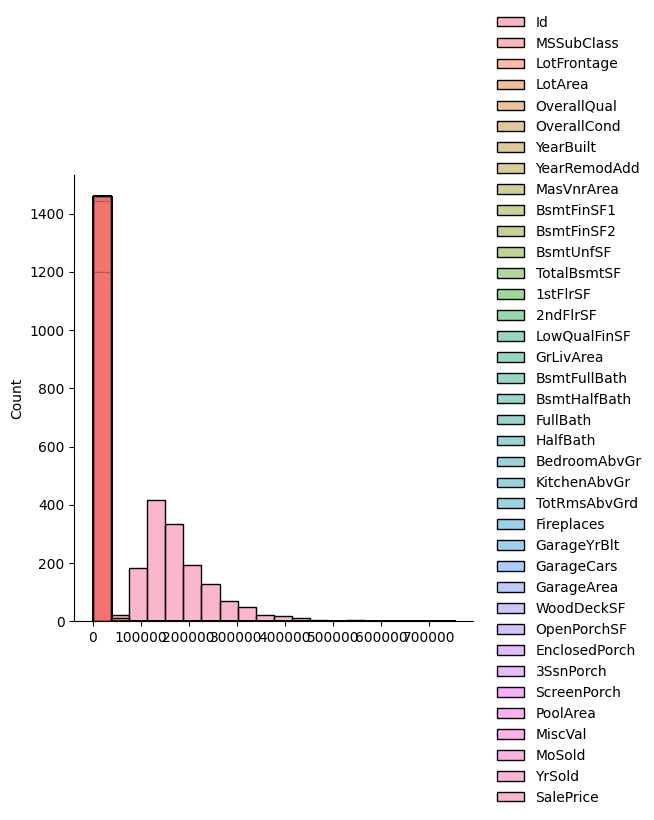

In [6]:
# plotting  a histogram and density plot 
sns.displot(train_data, bins = 20)

In [7]:
missing_values = test_data.isnull().sum()

In [8]:
missing_values

Id                 0
MSSubClass         0
MSZoning           4
LotFrontage      227
LotArea            0
                ... 
MiscVal            0
MoSold             0
YrSold             0
SaleType           1
SaleCondition      0
Length: 80, dtype: int64

In [9]:
train_data.shape
train_data.shape

(1460, 81)

In [10]:
train_data.drop(['LotFrontage','Fence','MiscFeature'], axis =1 , inplace=True)
test_data.drop(['LotFrontage','Fence','MiscFeature'],axis =1, inplace = True)

In [11]:
train_data.shape
test_data.shape

(1459, 77)

In [12]:
#numerical features
train_num= train_data.select_dtypes(include = [np.number])

In [13]:
train_num

,Id,MSSubClass,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
0,1,60,8450,7,5,2003,2003,196.0,706,0,...,0,61,0,0,0,0,0,2,2008,208500
1,2,20,9600,6,8,1976,1976,0.0,978,0,...,298,0,0,0,0,0,0,5,2007,181500
2,3,60,11250,7,5,2001,2002,162.0,486,0,...,0,42,0,0,0,0,0,9,2008,223500
3,4,70,9550,7,5,1915,1970,0.0,216,0,...,0,35,272,0,0,0,0,2,2006,140000
4,5,60,14260,8,5,2000,2000,350.0,655,0,...,192,84,0,0,0,0,0,12,2008,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,7917,6,5,1999,2000,0.0,0,0,...,0,40,0,0,0,0,0,8,2007,175000
1456,1457,20,13175,6,6,1978,1988,119.0,790,163,...,349,0,0,0,0,0,0,2,2010,210000
1457,1458,70,9042,7,9,1941,2006,0.0,275,0,...,0,60,0,0,0,0,2500,5,2010,266500
1458,1459,20,9717,5,6,1950,1996,0.0,49,1029,...,366,0,112,0,0,0,0,4,2010,142125


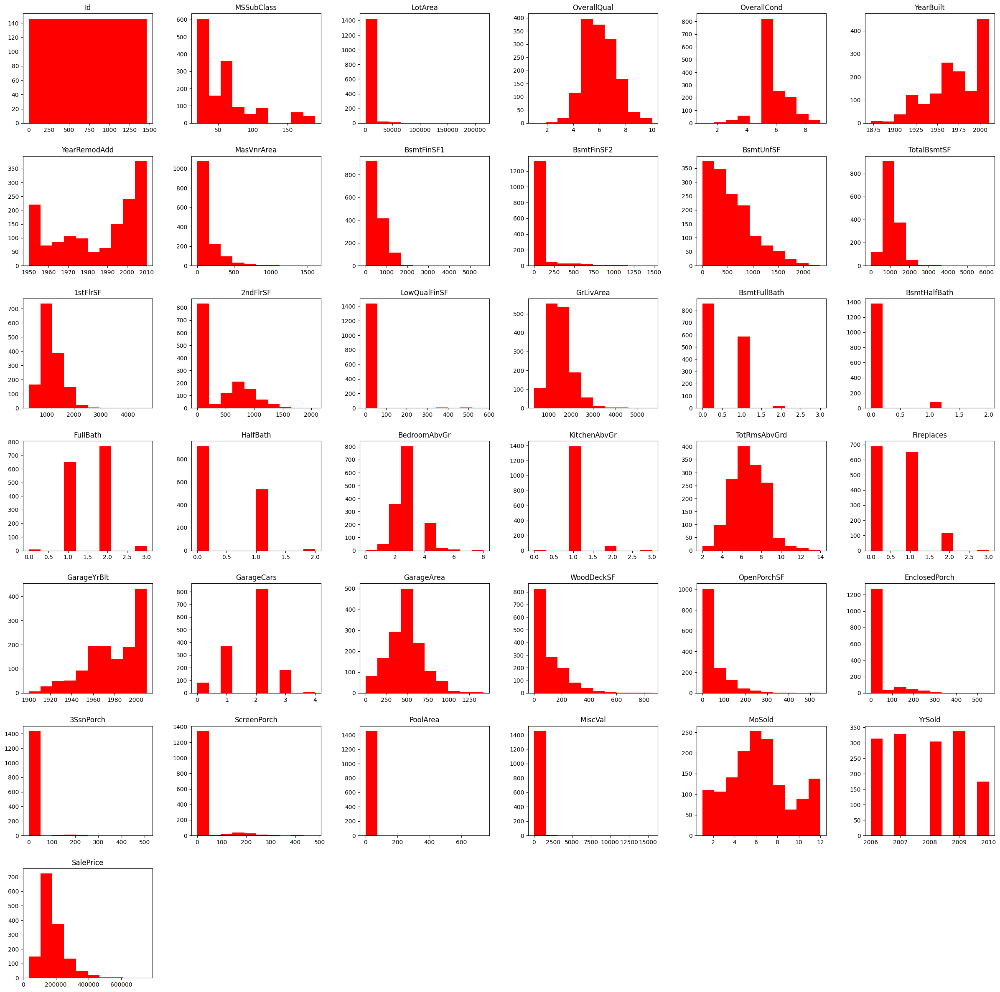

In [14]:
train_num.hist(figsize = (30,30), grid =False, color = 'red')
plt.show()

In [15]:
num_rows = len(train_num.index)
low_info = []

for col in train_num.columns:
    cnts = train_num[col].value_counts(dropna=False)
    top_pct = (cnts/num_rows).iloc[0]
    
    if top_pct > 0.85:
        low_info.append(col)
        print('{0}: {1:.5f}%'.format(col, top_pct*100))
        print(cnts)
        print()

BsmtFinSF2: 88.56164%
0       1293
180        5
374        3
551        2
147        2
        ... 
532        1
165        1
1120       1
311        1
1029       1
Name: BsmtFinSF2, Length: 144, dtype: int64

LowQualFinSF: 98.21918%
0      1434
80        3
360       2
205       1
479       1
397       1
514       1
120       1
481       1
232       1
53        1
515       1
156       1
473       1
420       1
390       1
371       1
392       1
144       1
572       1
528       1
234       1
513       1
384       1
Name: LowQualFinSF, dtype: int64

BsmtHalfBath: 94.38356%
0    1378
1      80
2       2
Name: BsmtHalfBath, dtype: int64

KitchenAbvGr: 95.34247%
1    1392
2      65
3       2
0       1
Name: KitchenAbvGr, dtype: int64

EnclosedPorch: 85.75342%
0      1252
112      15
96        6
192       5
144       5
       ... 
54        1
136       1
148       1
140       1
99        1
Name: EnclosedPorch, Length: 120, dtype: int64

3SsnPorch: 98.35616%
0      1436
168       3
144     

In [16]:
train_num = train_num.drop(columns = ['BsmtFinSF2', 'LowQualFinSF','BsmtHalfBath','KitchenAbvGr','EnclosedPorch','3SsnPorch','ScreenPorch','PoolArea','MiscVal'])

In [17]:
train_num 

,Id,MSSubClass,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtUnfSF,...,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,MoSold,YrSold,SalePrice
0,1,60,8450,7,5,2003,2003,196.0,706,150,...,8,0,2003.0,2,548,0,61,2,2008,208500
1,2,20,9600,6,8,1976,1976,0.0,978,284,...,6,1,1976.0,2,460,298,0,5,2007,181500
2,3,60,11250,7,5,2001,2002,162.0,486,434,...,6,1,2001.0,2,608,0,42,9,2008,223500
3,4,70,9550,7,5,1915,1970,0.0,216,540,...,7,1,1998.0,3,642,0,35,2,2006,140000
4,5,60,14260,8,5,2000,2000,350.0,655,490,...,9,1,2000.0,3,836,192,84,12,2008,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,7917,6,5,1999,2000,0.0,0,953,...,7,1,1999.0,2,460,0,40,8,2007,175000
1456,1457,20,13175,6,6,1978,1988,119.0,790,589,...,7,2,1978.0,2,500,349,0,2,2010,210000
1457,1458,70,9042,7,9,1941,2006,0.0,275,877,...,9,2,1941.0,1,252,0,60,5,2010,266500
1458,1459,20,9717,5,6,1950,1996,0.0,49,0,...,5,0,1950.0,1,240,366,0,4,2010,142125


In [18]:
#same for test data case
test_num= test_data.select_dtypes(include = [np.number])
#same for test data case
test_num = test_num.drop(columns = ['BsmtFinSF2', 'LowQualFinSF','BsmtHalfBath','KitchenAbvGr','EnclosedPorch','3SsnPorch','ScreenPorch','PoolArea','MiscVal'])

In [20]:
#correlation
corr = train_num.corr()['SalePrice'].sort_values().dropna()

In [21]:
corr.head()

MSSubClass    -0.084284
OverallCond   -0.077856
YrSold        -0.028923
Id            -0.021917
MoSold         0.046432
Name: SalePrice, dtype: float64

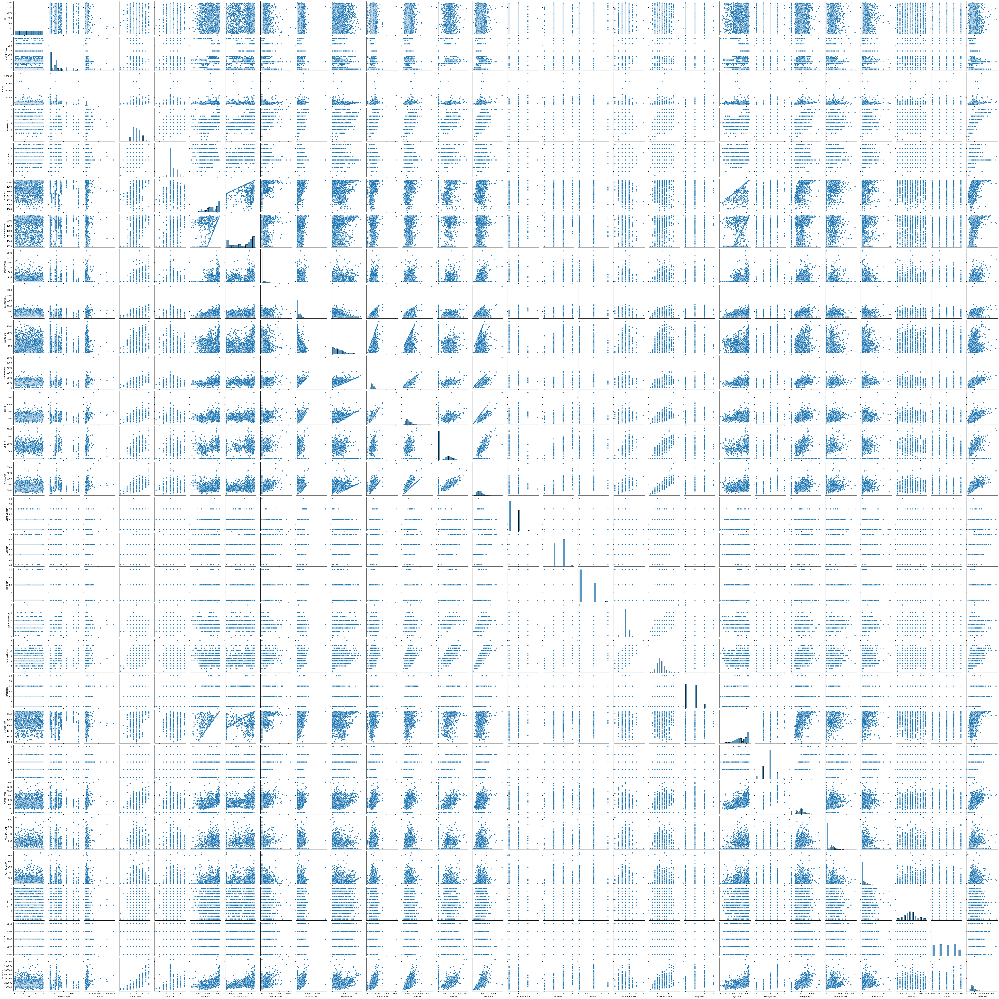

In [22]:
sns.pairplot(train_num)

In [23]:
#log transformation of numericla values
log_train_num = np.log(train_num)

C:\Users\abhis\AppData\Local\Programs\Python\Python311\Lib\site-packages\pandas\core\internals\blocks.py:351: RuntimeWarning: divide by zero encountered in log
  result = func(self.values, **kwargs)


In [24]:
log_train_num.replace([np.inf, -np.inf, np.nan], 0, inplace=True)

In [25]:
log_train_num

,Id,MSSubClass,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtUnfSF,...,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,MoSold,YrSold,SalePrice
0,0.000000,4.094345,9.041922,1.945910,1.609438,7.602401,7.602401,5.278115,6.559615,5.010635,...,2.079442,0.000000,7.602401,0.693147,6.306275,0.000000,4.110874,0.693147,7.604894,12.247694
1,0.693147,2.995732,9.169518,1.791759,2.079442,7.588830,7.588830,0.000000,6.885510,5.648974,...,1.791759,0.000000,7.588830,0.693147,6.131226,5.697093,0.000000,1.609438,7.604396,12.109011
2,1.098612,4.094345,9.328123,1.945910,1.609438,7.601402,7.601902,5.087596,6.186209,6.073045,...,1.791759,0.000000,7.601402,0.693147,6.410175,0.000000,3.737670,2.197225,7.604894,12.317167
3,1.386294,4.248495,9.164296,1.945910,1.609438,7.557473,7.585789,0.000000,5.375278,6.291569,...,1.945910,0.000000,7.599902,1.098612,6.464588,0.000000,3.555348,0.693147,7.603898,11.849398
4,1.609438,4.094345,9.565214,2.079442,1.609438,7.600902,7.600902,5.857933,6.484635,6.194405,...,2.197225,0.000000,7.600902,1.098612,6.728629,5.257495,4.430817,2.484907,7.604894,12.429216
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,7.283448,4.094345,8.976768,1.791759,1.609438,7.600402,7.600902,0.000000,0.000000,6.859615,...,1.945910,0.000000,7.600402,0.693147,6.131226,0.000000,3.688879,2.079442,7.604396,12.072541
1456,7.284135,2.995732,9.486076,1.791759,1.791759,7.589842,7.594884,4.779123,6.672033,6.378426,...,1.945910,0.693147,7.589842,0.693147,6.214608,5.855072,0.000000,0.693147,7.605890,12.254863
1457,7.284821,4.248495,9.109636,1.945910,2.197225,7.570959,7.603898,0.000000,5.616771,6.776507,...,2.197225,0.693147,7.570959,0.000000,5.529429,0.000000,4.094345,1.609438,7.605890,12.493130
1458,7.285507,2.995732,9.181632,1.609438,1.791759,7.575585,7.598900,0.000000,3.891820,0.000000,...,1.609438,0.000000,7.575585,0.000000,5.480639,5.902633,0.000000,1.386294,7.605890,11.864462


In [26]:
#log transformation of numericla values
log_test_num = np.log(test_num)

C:\Users\abhis\AppData\Local\Programs\Python\Python311\Lib\site-packages\pandas\core\internals\blocks.py:351: RuntimeWarning: divide by zero encountered in log
  result = func(self.values, **kwargs)


In [27]:
log_test_num.replace([np.inf, -np.inf, np.nan], 0, inplace=True)

In [28]:
log_test_num

,Id,MSSubClass,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtUnfSF,...,BedroomAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,MoSold,YrSold
0,7.286876,2.995732,9.360655,1.609438,1.791759,7.581210,7.581210,0.000000,6.148468,5.598422,...,0.693147,1.609438,0.0,7.581210,0.000000,6.593045,4.941642,0.000000,1.791759,7.605890
1,7.287561,2.995732,9.565704,1.791759,1.791759,7.579679,7.579679,4.682131,6.827629,6.006353,...,1.098612,1.791759,0.0,7.579679,0.000000,5.743003,5.973810,3.583519,1.791759,7.605890
2,7.288244,4.094345,9.534595,1.609438,1.609438,7.599401,7.599902,0.000000,6.673298,4.919981,...,1.098612,1.791759,0.0,7.599401,0.693147,6.177944,5.356586,3.526361,1.098612,7.605890
3,7.288928,4.094345,9.208138,1.791759,1.791759,7.599902,7.599902,2.995732,6.400257,5.780744,...,1.098612,1.945910,0.0,7.599902,0.693147,6.152733,5.886104,3.583519,1.791759,7.605890
4,7.289611,4.787492,8.518193,2.079442,1.609438,7.596894,7.596894,0.000000,5.572154,6.924612,...,0.693147,1.609438,0.0,7.596894,0.693147,6.226537,0.000000,4.406719,0.000000,7.605890
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1454,7.977625,5.075174,7.568379,1.386294,1.945910,7.585789,7.585789,0.000000,0.000000,6.302619,...,1.098612,1.609438,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,1.791759,7.603898
1455,7.977968,5.075174,7.546446,1.386294,1.609438,7.585789,7.585789,0.000000,5.529429,5.683580,...,1.098612,1.791759,0.0,7.585789,0.000000,5.655992,0.000000,3.178054,1.386294,7.603898
1456,7.978311,2.995732,9.903488,1.609438,1.945910,7.580700,7.598900,0.000000,7.109879,0.000000,...,1.386294,1.945910,0.0,7.580700,0.693147,6.356108,6.161207,0.000000,2.197225,7.603898
1457,7.978654,4.442651,9.253496,1.609438,1.609438,7.596894,7.596894,0.000000,5.820083,6.354370,...,1.098612,1.791759,0.0,0.000000,0.000000,0.000000,4.382027,3.465736,1.945910,7.603898


In [29]:
#transforming the categorical data 
train_categorical_sub = train_data.select_dtypes(exclude = [np.number])
train_categorical_sub

,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,...,Functional,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,SaleType,SaleCondition
0,RL,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,...,Typ,NaN,Attchd,RFn,TA,TA,Y,NaN,WD,Normal
1,RL,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,...,Typ,TA,Attchd,RFn,TA,TA,Y,NaN,WD,Normal
2,RL,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,...,Typ,TA,Attchd,RFn,TA,TA,Y,NaN,WD,Normal
3,RL,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,...,Typ,Gd,Detchd,Unf,TA,TA,Y,NaN,WD,Abnorml
4,RL,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,...,Typ,TA,Attchd,RFn,TA,TA,Y,NaN,WD,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,RL,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,...,Typ,TA,Attchd,RFn,TA,TA,Y,NaN,WD,Normal
1456,RL,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,...,Min1,TA,Attchd,Unf,TA,TA,Y,NaN,WD,Normal
1457,RL,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Crawfor,Norm,...,Typ,Gd,Attchd,RFn,TA,TA,Y,NaN,WD,Normal
1458,RL,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,...,Typ,NaN,Attchd,Unf,TA,TA,Y,NaN,WD,Normal


In [30]:
num_rows = len(train_categorical_sub.index)
low_information_cols = []

for col in train_categorical_sub.columns:
    cnts = train_categorical_sub[col].value_counts(dropna=False)
    top_pct = (cnts/num_rows).iloc[0]
    
    if top_pct > 0.85:
        low_information_cols.append(col)
        print('{0}: {1:.5f}%'.format(col, top_pct*100))
        print(cnts)
        print()

Street: 99.58904%
Pave    1454
Grvl       6
Name: Street, dtype: int64

Alley: 93.76712%
NaN     1369
Grvl      50
Pave      41
Name: Alley, dtype: int64

LandContour: 89.79452%
Lvl    1311
Bnk      63
HLS      50
Low      36
Name: LandContour, dtype: int64

Utilities: 99.93151%
AllPub    1459
NoSeWa       1
Name: Utilities, dtype: int64

LandSlope: 94.65753%
Gtl    1382
Mod      65
Sev      13
Name: LandSlope, dtype: int64

Condition1: 86.30137%
Norm      1260
Feedr       81
Artery      48
RRAn        26
PosN        19
RRAe        11
PosA         8
RRNn         5
RRNe         2
Name: Condition1, dtype: int64

Condition2: 98.97260%
Norm      1445
Feedr        6
Artery       2
RRNn         2
PosN         2
PosA         1
RRAn         1
RRAe         1
Name: Condition2, dtype: int64

RoofMatl: 98.21918%
CompShg    1434
Tar&Grv      11
WdShngl       6
WdShake       5
Metal         1
Membran       1
Roll          1
ClyTile       1
Name: RoofMatl, dtype: int64

ExterCond: 87.80822%
TA    128

In [31]:
train_categorical_sub = train_categorical_sub.drop(columns = ['Street','LandContour',
            'Utilities','LandSlope','Condition1','Condition2','RoofMatl',
            'ExterCond','BsmtCond','BsmtFinType2','Heating','CentralAir',
            'Electrical','Functional', 'GarageQual','GarageCond','PavedDrive',
            'SaleType'])
train_categorical_sub

,MSZoning,Alley,LotShape,LotConfig,Neighborhood,BldgType,HouseStyle,RoofStyle,Exterior1st,Exterior2nd,...,BsmtQual,BsmtExposure,BsmtFinType1,HeatingQC,KitchenQual,FireplaceQu,GarageType,GarageFinish,PoolQC,SaleCondition
0,RL,NaN,Reg,Inside,CollgCr,1Fam,2Story,Gable,VinylSd,VinylSd,...,Gd,No,GLQ,Ex,Gd,NaN,Attchd,RFn,NaN,Normal
1,RL,NaN,Reg,FR2,Veenker,1Fam,1Story,Gable,MetalSd,MetalSd,...,Gd,Gd,ALQ,Ex,TA,TA,Attchd,RFn,NaN,Normal
2,RL,NaN,IR1,Inside,CollgCr,1Fam,2Story,Gable,VinylSd,VinylSd,...,Gd,Mn,GLQ,Ex,Gd,TA,Attchd,RFn,NaN,Normal
3,RL,NaN,IR1,Corner,Crawfor,1Fam,2Story,Gable,Wd Sdng,Wd Shng,...,TA,No,ALQ,Gd,Gd,Gd,Detchd,Unf,NaN,Abnorml
4,RL,NaN,IR1,FR2,NoRidge,1Fam,2Story,Gable,VinylSd,VinylSd,...,Gd,Av,GLQ,Ex,Gd,TA,Attchd,RFn,NaN,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,RL,NaN,Reg,Inside,Gilbert,1Fam,2Story,Gable,VinylSd,VinylSd,...,Gd,No,Unf,Ex,TA,TA,Attchd,RFn,NaN,Normal
1456,RL,NaN,Reg,Inside,NWAmes,1Fam,1Story,Gable,Plywood,Plywood,...,Gd,No,ALQ,TA,TA,TA,Attchd,Unf,NaN,Normal
1457,RL,NaN,Reg,Inside,Crawfor,1Fam,2Story,Gable,CemntBd,CmentBd,...,TA,No,GLQ,Ex,Gd,Gd,Attchd,RFn,NaN,Normal
1458,RL,NaN,Reg,Inside,NAmes,1Fam,1Story,Hip,MetalSd,MetalSd,...,TA,Mn,GLQ,Gd,Gd,NaN,Attchd,Unf,NaN,Normal


In [32]:
#transforming the categorical data 
test_categorical_sub = test_data.select_dtypes(exclude = [np.number])
test_categorical_sub


test_categorical_sub = test_categorical_sub.drop(columns = ['Street','LandContour',
            'Utilities','LandSlope','Condition1','Condition2','RoofMatl',
            'ExterCond','BsmtCond','BsmtFinType2','Heating','CentralAir',
            'Electrical','Functional', 'GarageQual','GarageCond','PavedDrive',
            'SaleType'])
test_categorical_sub

,MSZoning,Alley,LotShape,LotConfig,Neighborhood,BldgType,HouseStyle,RoofStyle,Exterior1st,Exterior2nd,...,BsmtQual,BsmtExposure,BsmtFinType1,HeatingQC,KitchenQual,FireplaceQu,GarageType,GarageFinish,PoolQC,SaleCondition
0,RH,NaN,Reg,Inside,NAmes,1Fam,1Story,Gable,VinylSd,VinylSd,...,TA,No,Rec,TA,TA,NaN,Attchd,Unf,NaN,Normal
1,RL,NaN,IR1,Corner,NAmes,1Fam,1Story,Hip,Wd Sdng,Wd Sdng,...,TA,No,ALQ,TA,Gd,NaN,Attchd,Unf,NaN,Normal
2,RL,NaN,IR1,Inside,Gilbert,1Fam,2Story,Gable,VinylSd,VinylSd,...,Gd,No,GLQ,Gd,TA,TA,Attchd,Fin,NaN,Normal
3,RL,NaN,IR1,Inside,Gilbert,1Fam,2Story,Gable,VinylSd,VinylSd,...,TA,No,GLQ,Ex,Gd,Gd,Attchd,Fin,NaN,Normal
4,RL,NaN,IR1,Inside,StoneBr,TwnhsE,1Story,Gable,HdBoard,HdBoard,...,Gd,No,ALQ,Ex,Gd,NaN,Attchd,RFn,NaN,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1454,RM,NaN,Reg,Inside,MeadowV,Twnhs,2Story,Gable,CemntBd,CmentBd,...,TA,No,Unf,Gd,TA,NaN,NaN,NaN,NaN,Normal
1455,RM,NaN,Reg,Inside,MeadowV,TwnhsE,2Story,Gable,CemntBd,CmentBd,...,TA,No,Rec,TA,TA,NaN,CarPort,Unf,NaN,Abnorml
1456,RL,NaN,Reg,Inside,Mitchel,1Fam,1Story,Gable,VinylSd,VinylSd,...,TA,No,ALQ,Ex,TA,TA,Detchd,Unf,NaN,Abnorml
1457,RL,NaN,Reg,Inside,Mitchel,1Fam,SFoyer,Gable,HdBoard,Wd Shng,...,Gd,Av,GLQ,TA,TA,NaN,NaN,NaN,NaN,Normal


In [33]:
# Before applying one hot encode to categorical variable, we have noticed that the unique values between the train set and test set are not matching. For example, in train set, Housestyle has 8 unique items while it has 7 items in test set. The same problem can be seen also in Exterior2nd, RoofStyle. So we need to remove the excess items from the training set

In [34]:
train_categorical_sub.describe().T

,count,unique,top,freq
MSZoning,1460,5,RL,1151
Alley,91,2,Grvl,50
LotShape,1460,4,Reg,925
LotConfig,1460,5,Inside,1052
Neighborhood,1460,25,NAmes,225
BldgType,1460,5,1Fam,1220
HouseStyle,1460,8,1Story,726
RoofStyle,1460,6,Gable,1141
Exterior1st,1460,15,VinylSd,515
Exterior2nd,1460,16,VinylSd,504


In [35]:
test_categorical_sub.describe().T

,count,unique,top,freq
MSZoning,1455,5,RL,1114
Alley,107,2,Grvl,70
LotShape,1459,4,Reg,934
LotConfig,1459,5,Inside,1081
Neighborhood,1459,25,NAmes,218
BldgType,1459,5,1Fam,1205
HouseStyle,1459,7,1Story,745
RoofStyle,1459,6,Gable,1169
Exterior1st,1458,13,VinylSd,510
Exterior2nd,1458,15,VinylSd,510


In [36]:
# one hot encoding 
from sklearn.preprocessing import LabelEncoder, LabelBinarizer, OneHotEncoder
from pandas import get_dummies

In [37]:
encoder=LabelEncoder()

In [38]:
train_categorical_sub['MSZoning']=encoder.fit_transform(train_categorical_sub['MSZoning'])
train_categorical_sub['Alley']=encoder.fit_transform(train_categorical_sub['Alley'])
train_categorical_sub['LotShape']=encoder.fit_transform(train_categorical_sub['LotShape'])
train_categorical_sub['LotConfig']=encoder.fit_transform(train_categorical_sub['LotConfig'])
train_categorical_sub['Neighborhood']=encoder.fit_transform(train_categorical_sub['Neighborhood'])
train_categorical_sub['BldgType']=encoder.fit_transform(train_categorical_sub['BldgType'])
train_categorical_sub['HouseStyle']=encoder.fit_transform(train_categorical_sub['HouseStyle'])
train_categorical_sub['RoofStyle']=encoder.fit_transform(train_categorical_sub['RoofStyle'])
train_categorical_sub['Exterior1st']=encoder.fit_transform(train_categorical_sub['Exterior1st'])
train_categorical_sub['Exterior2nd']=encoder.fit_transform(train_categorical_sub['Exterior2nd'])
train_categorical_sub['MasVnrType']=encoder.fit_transform(train_categorical_sub['MasVnrType'])
train_categorical_sub['ExterQual']=encoder.fit_transform(train_categorical_sub['ExterQual'])
train_categorical_sub['Foundation']=encoder.fit_transform(train_categorical_sub['Foundation'])
train_categorical_sub['BsmtQual']=encoder.fit_transform(train_categorical_sub['BsmtQual'])
train_categorical_sub['BsmtExposure']=encoder.fit_transform(train_categorical_sub['BsmtExposure'])
train_categorical_sub['BsmtFinType1']=encoder.fit_transform(train_categorical_sub['BsmtFinType1'])
train_categorical_sub['HeatingQC']=encoder.fit_transform(train_categorical_sub['HeatingQC'])
train_categorical_sub['KitchenQual']=encoder.fit_transform(train_categorical_sub['KitchenQual'])
train_categorical_sub['FireplaceQu']=encoder.fit_transform(train_categorical_sub['FireplaceQu'])
train_categorical_sub['GarageType']=encoder.fit_transform(train_categorical_sub['GarageType'])
train_categorical_sub['GarageFinish']=encoder.fit_transform(train_categorical_sub['GarageFinish'])
train_categorical_sub['PoolQC']=encoder.fit_transform(train_categorical_sub['PoolQC'])
train_categorical_sub['SaleCondition']=encoder.fit_transform(train_categorical_sub['SaleCondition'])


In [39]:
train_categorical_sub

,MSZoning,Alley,LotShape,LotConfig,Neighborhood,BldgType,HouseStyle,RoofStyle,Exterior1st,Exterior2nd,...,BsmtQual,BsmtExposure,BsmtFinType1,HeatingQC,KitchenQual,FireplaceQu,GarageType,GarageFinish,PoolQC,SaleCondition
0,3,2,3,4,5,0,5,1,12,13,...,2,3,2,0,2,5,1,1,3,4
1,3,2,3,2,24,0,2,1,8,8,...,2,1,0,0,3,4,1,1,3,4
2,3,2,0,4,5,0,5,1,12,13,...,2,2,2,0,2,4,1,1,3,4
3,3,2,0,0,6,0,5,1,13,15,...,3,3,0,2,2,2,5,2,3,0
4,3,2,0,2,15,0,5,1,12,13,...,2,0,2,0,2,4,1,1,3,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,3,2,3,4,8,0,5,1,12,13,...,2,3,5,0,3,4,1,1,3,4
1456,3,2,3,4,14,0,2,1,9,10,...,2,3,0,4,3,4,1,2,3,4
1457,3,2,3,4,6,0,5,1,5,5,...,3,3,2,0,2,2,1,1,3,4
1458,3,2,3,4,12,0,2,3,8,8,...,3,2,2,2,2,5,1,2,3,4


In [40]:
test_categorical_sub['Alley']=encoder.fit_transform(test_categorical_sub['Alley'])
test_categorical_sub['LotShape']=encoder.fit_transform(test_categorical_sub['LotShape'])
test_categorical_sub['LotConfig']=encoder.fit_transform(test_categorical_sub['LotConfig'])
test_categorical_sub['Neighborhood']=encoder.fit_transform(test_categorical_sub['Neighborhood'])
test_categorical_sub['BldgType']=encoder.fit_transform(test_categorical_sub['BldgType'])
test_categorical_sub['HouseStyle']=encoder.fit_transform(test_categorical_sub['HouseStyle'])
test_categorical_sub['RoofStyle']=encoder.fit_transform(test_categorical_sub['RoofStyle'])
test_categorical_sub['Exterior1st']=encoder.fit_transform(test_categorical_sub['Exterior1st'])
test_categorical_sub['Exterior2nd']=encoder.fit_transform(test_categorical_sub['Exterior2nd'])
test_categorical_sub['MasVnrType']=encoder.fit_transform(test_categorical_sub['MasVnrType'])
test_categorical_sub['ExterQual']=encoder.fit_transform(test_categorical_sub['ExterQual'])
test_categorical_sub['Foundation']=encoder.fit_transform(test_categorical_sub['Foundation'])
test_categorical_sub['BsmtQual']=encoder.fit_transform(test_categorical_sub['BsmtQual'])
test_categorical_sub['BsmtExposure']=encoder.fit_transform(test_categorical_sub['BsmtExposure'])
test_categorical_sub['BsmtFinType1']=encoder.fit_transform(test_categorical_sub['BsmtFinType1'])
test_categorical_sub['HeatingQC']=encoder.fit_transform(test_categorical_sub['HeatingQC'])
test_categorical_sub['KitchenQual']=encoder.fit_transform(test_categorical_sub['KitchenQual'])
test_categorical_sub['FireplaceQu']=encoder.fit_transform(test_categorical_sub['FireplaceQu'])
test_categorical_sub['GarageType']=encoder.fit_transform(test_categorical_sub['GarageType'])
test_categorical_sub['GarageFinish']=encoder.fit_transform(test_categorical_sub['GarageFinish'])
test_categorical_sub['PoolQC']=encoder.fit_transform(test_categorical_sub['PoolQC'])
test_categorical_sub['SaleCondition']=encoder.fit_transform(test_categorical_sub['SaleCondition'])
test_categorical_sub['MSZoning']=encoder.fit_transform(test_categorical_sub['MSZoning'])


In [41]:
test_categorical_sub

,MSZoning,Alley,LotShape,LotConfig,Neighborhood,BldgType,HouseStyle,RoofStyle,Exterior1st,Exterior2nd,...,BsmtQual,BsmtExposure,BsmtFinType1,HeatingQC,KitchenQual,FireplaceQu,GarageType,GarageFinish,PoolQC,SaleCondition
0,2,2,3,4,12,0,2,1,10,12,...,3,3,4,4,3,5,1,2,2,4
1,3,2,0,0,12,0,2,3,11,13,...,3,3,0,4,2,5,1,2,2,4
2,3,2,0,4,8,0,4,1,10,12,...,2,3,2,2,3,4,1,0,2,4
3,3,2,0,4,8,0,4,1,10,12,...,3,3,2,0,2,2,1,0,2,4
4,3,2,0,4,22,4,2,1,6,6,...,2,3,0,0,2,5,1,1,2,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1454,4,2,3,4,10,3,4,1,5,5,...,3,3,5,2,3,5,6,3,2,4
1455,4,2,3,4,10,4,4,1,5,5,...,3,3,4,4,3,5,4,2,2,0
1456,3,2,3,4,11,0,2,1,10,12,...,3,3,0,0,3,4,5,2,2,0
1457,3,2,3,4,11,0,5,1,6,14,...,2,0,2,4,3,5,6,3,2,4


In [42]:
train_features = pd.concat([log_train_num,train_categorical_sub], axis = 1)
test_features = pd.concat([log_test_num,test_categorical_sub], axis = 1)

In [62]:
train_features = train_features[:-1]
train_features

,Id,MSSubClass,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtUnfSF,...,BsmtQual,BsmtExposure,BsmtFinType1,HeatingQC,KitchenQual,FireplaceQu,GarageType,GarageFinish,PoolQC,SaleCondition
0,0.000000,4.094345,9.041922,1.945910,1.609438,7.602401,7.602401,5.278115,6.559615,5.010635,...,2,3,2,0,2,5,1,1,3,4
1,0.693147,2.995732,9.169518,1.791759,2.079442,7.588830,7.588830,0.000000,6.885510,5.648974,...,2,1,0,0,3,4,1,1,3,4
2,1.098612,4.094345,9.328123,1.945910,1.609438,7.601402,7.601902,5.087596,6.186209,6.073045,...,2,2,2,0,2,4,1,1,3,4
3,1.386294,4.248495,9.164296,1.945910,1.609438,7.557473,7.585789,0.000000,5.375278,6.291569,...,3,3,0,2,2,2,5,2,3,0
4,1.609438,4.094345,9.565214,2.079442,1.609438,7.600902,7.600902,5.857933,6.484635,6.194405,...,2,0,2,0,2,4,1,1,3,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1454,7.282761,2.995732,8.922658,1.945910,1.609438,7.602900,7.603399,0.000000,6.016157,6.698268,...,2,3,2,0,2,5,1,1,3,4
1455,7.283448,4.094345,8.976768,1.791759,1.609438,7.600402,7.600902,0.000000,0.000000,6.859615,...,2,3,5,0,3,4,1,1,3,4
1456,7.284135,2.995732,9.486076,1.791759,1.791759,7.589842,7.594884,4.779123,6.672033,6.378426,...,2,3,0,4,3,4,1,2,3,4
1457,7.284821,4.248495,9.109636,1.945910,2.197225,7.570959,7.603898,0.000000,5.616771,6.776507,...,3,3,2,0,2,2,1,1,3,4


In [63]:
test_features

,Id,MSSubClass,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtUnfSF,...,BsmtQual,BsmtExposure,BsmtFinType1,HeatingQC,KitchenQual,FireplaceQu,GarageType,GarageFinish,PoolQC,SaleCondition
0,7.286876,2.995732,9.360655,1.609438,1.791759,7.581210,7.581210,0.000000,6.148468,5.598422,...,3,3,4,4,3,5,1,2,2,4
1,7.287561,2.995732,9.565704,1.791759,1.791759,7.579679,7.579679,4.682131,6.827629,6.006353,...,3,3,0,4,2,5,1,2,2,4
2,7.288244,4.094345,9.534595,1.609438,1.609438,7.599401,7.599902,0.000000,6.673298,4.919981,...,2,3,2,2,3,4,1,0,2,4
3,7.288928,4.094345,9.208138,1.791759,1.791759,7.599902,7.599902,2.995732,6.400257,5.780744,...,3,3,2,0,2,2,1,0,2,4
4,7.289611,4.787492,8.518193,2.079442,1.609438,7.596894,7.596894,0.000000,5.572154,6.924612,...,2,3,0,0,2,5,1,1,2,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1454,7.977625,5.075174,7.568379,1.386294,1.945910,7.585789,7.585789,0.000000,0.000000,6.302619,...,3,3,5,2,3,5,6,3,2,4
1455,7.977968,5.075174,7.546446,1.386294,1.609438,7.585789,7.585789,0.000000,5.529429,5.683580,...,3,3,4,4,3,5,4,2,2,0
1456,7.978311,2.995732,9.903488,1.609438,1.945910,7.580700,7.598900,0.000000,7.109879,0.000000,...,3,3,0,0,3,4,5,2,2,0
1457,7.978654,4.442651,9.253496,1.609438,1.609438,7.596894,7.596894,0.000000,5.820083,6.354370,...,2,0,2,4,3,5,6,3,2,4


In [64]:
merged_data = pd.concat([train_features, test_features], axis = 0)
merged_data

,Id,MSSubClass,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtUnfSF,...,BsmtQual,BsmtExposure,BsmtFinType1,HeatingQC,KitchenQual,FireplaceQu,GarageType,GarageFinish,PoolQC,SaleCondition
0,0.000000,4.094345,9.041922,1.945910,1.609438,7.602401,7.602401,5.278115,6.559615,5.010635,...,2,3,2,0,2,5,1,1,3,4
1,0.693147,2.995732,9.169518,1.791759,2.079442,7.588830,7.588830,0.000000,6.885510,5.648974,...,2,1,0,0,3,4,1,1,3,4
2,1.098612,4.094345,9.328123,1.945910,1.609438,7.601402,7.601902,5.087596,6.186209,6.073045,...,2,2,2,0,2,4,1,1,3,4
3,1.386294,4.248495,9.164296,1.945910,1.609438,7.557473,7.585789,0.000000,5.375278,6.291569,...,3,3,0,2,2,2,5,2,3,0
4,1.609438,4.094345,9.565214,2.079442,1.609438,7.600902,7.600902,5.857933,6.484635,6.194405,...,2,0,2,0,2,4,1,1,3,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1454,7.977625,5.075174,7.568379,1.386294,1.945910,7.585789,7.585789,0.000000,0.000000,6.302619,...,3,3,5,2,3,5,6,3,2,4
1455,7.977968,5.075174,7.546446,1.386294,1.609438,7.585789,7.585789,0.000000,5.529429,5.683580,...,3,3,4,4,3,5,4,2,2,0
1456,7.978311,2.995732,9.903488,1.609438,1.945910,7.580700,7.598900,0.000000,7.109879,0.000000,...,3,3,0,0,3,4,5,2,2,0
1457,7.978654,4.442651,9.253496,1.609438,1.609438,7.596894,7.596894,0.000000,5.820083,6.354370,...,2,0,2,4,3,5,6,3,2,4


In [65]:
train = merged_data.iloc[:1459,:]
test = merged_data.iloc[1459:,:]
print(train.shape)
print(test.shape)

(1459, 51)
(1459, 51)


In [66]:
X_train = train.drop(['SalePrice', 'Id'], axis = 1)
Y_train = np.array(train['SalePrice']).reshape((-1,1))
X_test = test.drop(['Id'], axis = 1)

print(X_train.shape)
print(Y_train.shape)
print(X_test.shape)

(1459, 49)
(1459, 1)
(1459, 50)


In [48]:
print(Y_train)

[[12.24769432]
 [12.10901093]
 [12.31716669]
 ...
 [12.25486281]
 [12.49312952]
 [11.86446223]]


In [68]:
import seaborn as sns
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.impute import SimpleImputer
imputer=SimpleImputer(missing_values=np.nan,strategy='median')
from sklearn.neighbors import KNeighborsRegressor
from sklearn.impute import SimpleImputer
import xgboost
from numpy import nan
from numpy import isnan
from sklearn.metrics import mean_squared_error

In [69]:
imputer = SimpleImputer(missing_values=nan, strategy='median')
X_train = imputer.fit_transform(X_train)
print('Missing: %d' % isnan(X_train).sum())

Missing: 0


In [70]:
Y_train = imputer.fit_transform(Y_train)
print('Missing: %d' % isnan(Y_train).sum())

Missing: 0


In [71]:
X_test = imputer.fit_transform(X_test)
print('Missing: %d' % isnan(X_test).sum())

Missing: 0


In [72]:
# Make sure all values are finite
print(np.where(~np.isfinite(X_train)))
print(np.where(~np.isfinite(Y_train)))
print(np.where(~np.isfinite(X_test)))

(array([], dtype=int64), array([], dtype=int64))
(array([], dtype=int64), array([], dtype=int64))
(array([], dtype=int64), array([], dtype=int64))


In [73]:
def RMSE(Y_train, y_pred):
    return mean_squared_error(Y_train, y_pred,squared = False)

In [74]:
def fit_and_evaluate (model):
    model.fit(X_train, Y_train.ravel())
    model_pred = model.predict(X_test)
    model_RMSE = RMSE(Y_train, model_pred)
    
    return model_RMSE

In [75]:
# Support Vector Regressor
svr = SVR(C=1000, gamma = 0.1)
svr_RMSE = fit_and_evaluate(svr)
svr_RMSE

0.4069980494725451

In [76]:
# Random Forest Regressor
random_forest = RandomForestRegressor(random_state=60)
random_forest_RMSE = fit_and_evaluate(random_forest)
random_forest_RMSE

0.5401116829672716

In [77]:
# Gradient Boosting Regressor
gradient_boosted = GradientBoostingRegressor(learning_rate = 0.1,random_state=60)
gradient_boosted_RMSE = fit_and_evaluate(gradient_boosted)
gradient_boosted_RMSE

0.5511966803082772

In [79]:
#XGB Regressor
xboost = xgboost.XGBRegressor(random_state = 60)
xboost_RMSE = fit_and_evaluate(xboost)
xboost_RMSE

0.5562430703926147

In [80]:
# KNeighbors Regressor
knn = KNeighborsRegressor(n_neighbors=10)
knn_RMSE = fit_and_evaluate(knn)
knn_RMSE

0.510003110526245

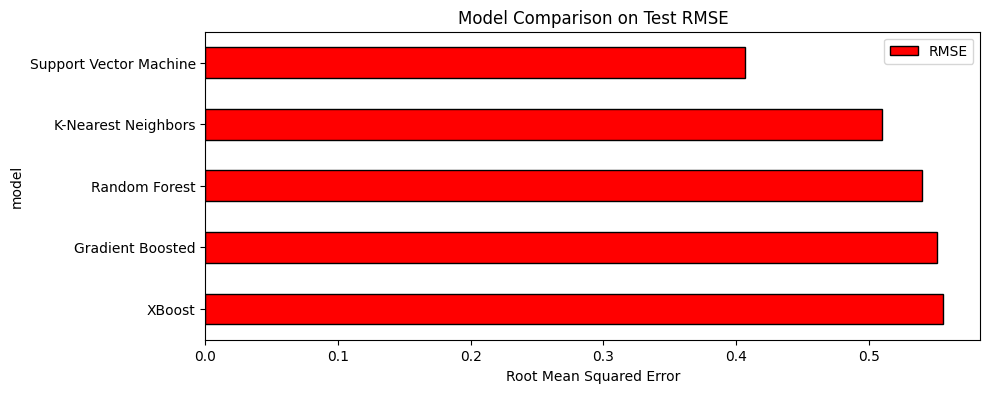

In [82]:
model_comparison = pd.DataFrame({'model': [ 'Support Vector Machine',
                                           'Random Forest', 'Gradient Boosted',
                                            'K-Nearest Neighbors','XBoost'],
                                 'RMSE': [svr_RMSE, random_forest_RMSE, 
                                         gradient_boosted_RMSE, knn_RMSE,xboost_RMSE]})

model_comparison.sort_values('RMSE', ascending = False).plot(x = 'model',
                                                             y = 'RMSE', kind = 'barh', color = 'red',
                                                             edgecolor = 'black', figsize = (10,4))
plt.xlabel('Root Mean Squared Error')
plt.title('Model Comparison on Test RMSE')
plt.show()

In [83]:
#Since the Supoort Vector Regressor has the lowest Root Mean Squared Error (RMSE) among the regressor. So we will proceed predicting the house price with SVR

In [84]:
SVM = SVR().fit(X_train, Y_train.ravel())
score = SVM.score(X_train, Y_train)
print('R_squared:', score)
print('RMSE:', svr_RMSE)

R_squared: 0.8783211753847573
RMSE: 0.4069980494725451


In [85]:
HousePrice_Prediction_with_log = SVM.predict(X_test)
HousePrice_Prediction_with_log

array([11.73062144, 12.04941614, 12.16040475, ..., 11.94221269,
       11.75329741, 12.33169067])

In [86]:
#Now, we will transform the predictions to the correct format because we have taken the logarithm previously. To reverse the natural logarithm, we will use exp function.

In [87]:
HousePrice_Prediction_without_log = np.exp(HousePrice_Prediction_with_log)
HousePrice_Prediction_without_log

array([124320.9044423 , 170999.5394356 , 191071.83748896, ...,
       153616.21957639, 127172.20704578, 226769.79684282])

In [88]:
submission = pd.DataFrame()
submission['Id'] = test_data.Id
submission['SalePrice'] = HousePrice_Prediction_without_log

In [89]:
# checking the dataset
submission

,Id,SalePrice
0,1461,124320.904442
1,1462,170999.539436
2,1463,191071.837489
3,1464,211966.631635
4,1465,182937.769793
...,...,...
1454,2915,84267.021775
1455,2916,85287.407333
1456,2917,153616.219576
1457,2918,127172.207046


In [90]:
submission.to_csv('submission.csv', index = False)